<a href="https://colab.research.google.com/github/MATHKIMS/dongwoo_project/blob/main/detectpothole.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

YOLO V5를 활용한 Pot Hole 탐지모델개발


In [ ]:
!python3 -c 'import tensorflow as tf; print(tf.__version__)' #설치되어있는 버전확인

2.8.2


공공데이터가 없으면 구글 이미지 한번에 저장하는법 검색해서 박스를 직접 만들어줘야함

이미지박스 만들기. (레이블링 방법)

In [ ]:
import os
os.getcwd()

'/content'

욜로 V5모델 다운로드 및 설치

In [ ]:
!git clone https://github.com/ultralytics/yolov5 
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 12621, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 12621 (delta 0), reused 1 (delta 0), pack-reused 12618
Receiving objects: 100% (12621/12621), 12.52 MiB | 17.60 MiB/s, done.
Resolving deltas: 100% (8653/8653), done.
/content/yolov5


In [ ]:
%pip install -qr requirements.txt #라이브러리 설치

     |████████████████████████████████| 596 kB 28.1 MB/s 


### Pot Hole data 다운로드 및 압축 풀기

In [ ]:
%mkdir /content/yolov5/pothole #팟홀 디렉토리 만들기

In [ ]:
%cd /content/yolov5/pothole
!curl -L "https://public.roboflow.com/ds/r70p9kS8yn?key=vP0tC1TSRO" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

/content/yolov5/pothole
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   1812      0 --:--:-- --:--:-- --:--:--  1809
100 46.0M  100 46.0M    0     0  48.2M      0 --:--:-- --:--:-- --:--:-- 48.2M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/img-105_jpg.rf.3fe9dff3d1631e79ecb480ff403bcb86.jpg  
 extracting: test/images/img-107_jpg.rf.2e40485785f6e5e2efec404301b235c2.jpg  
 extracting: test/images/img-146_jpg.rf.61be25b3053a51f622a244980545df2b.jpg  
 extracting: test/images/img-161_jpg.rf.211541e7178a4a93ec0680f26b905427.jpg  
 extracting: test/images/img-168_jpg.rf.af3590e07b06b43e91fa53990ff94af3.jpg  
 extracting: test/images/img-179_jpg.rf.8632eb0d9b75fefe144829e67b75015a.jpg  
 ext

In [ ]:
from glob import glob
train_img_list = glob('/content/yolov5/pothole/train/images/*.jpg')
test_img_list = glob('/content/yolov5/pothole/test/images/*.jpg')
valid_img_list = glob('/content/yolov5/pothole/valid/images/*.jpg')
print(len(train_img_list),len(test_img_list),len(vaild_img_list)) #개수파악

465 67 41


In [ ]:
#파일쓰기
with open('/content/yolov5/pothole/train.txt','w') as f:  
  f.write('\n'.join(train_img_list)+'\n')
with open('/content/yolov5/pothole/test.txt','w') as f:
  f.write('\n'.join(test_img_list)+'\n')
with open('/content/yolov5/pothole/valid.txt','w') as f:
  f.write('\n'.join(valid_img_list)+'\n')

In [ ]:
%cat /content/yolov5/pothole/data.yaml #코드로 yaml파일 읽는법

train: ../train/images
val: ../valid/images

nc: 1
names: ['pothole']

In [ ]:
from IPython.core.magic import register_line_cell_magic

# Creating Magic Function참조: https://switowski.com/blog/creating-magic-functions-part2
@register_line_cell_magic
def writetemplate(line, cell):
  with open(line, 'w') as f:
    f.write(cell.format(**globals())) 

In [ ]:
%%writetemplate /content/yolov5/pothole/data.yaml

train: ./pothole/train/images
test: ./pothole/test/images
val: ./pothole/valid/images

nc: 1
names: ['pothole']

In [ ]:
%cat /content/yolov5/pothole/data.yaml #수정된것을 볼수있다.


train: ./pothole/train/images
test: ./pothole/test/images
val: ./pothole/valid/images

nc: 1
names: ['pothole']

In [ ]:
import yaml

with open("/content/yolov5/pothole/data.yaml", 'r') as stream:
  num_classes = str(yaml.safe_load(stream)['nc'])  

모델은 욜로 yolov5s.yaml파일을 사용

In [ ]:

%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
%cat /content/yolov5/models/custom_yolov5s.yaml


*  img: 입력이미지 크기
catch: 배치크기 결정
epochs: 에포크
data: 학습에 사용될 yaml 파일 경로 지정
cfg: 모델 구성 지정
weights: 가중치에 대한 경로 지정
name: 결과 이름
nosave: 최종 체크포인트만 저장
cache: 빠른 학습을 위한 이미지 캐시가


In [ ]:
%%time
%cd /content/yolov5/
!python train.py --img 640 --batch 32 --epochs 150 --data ./pothole/data.yaml --cfg ./models/custom_yolov5s.yaml --weights yolov5s.pt --name pothole_results --cache

/content/yolov5
train: weights=yolov5s.pt, cfg=./models/custom_yolov5s.yaml, data=./pothole/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=pothole_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-386-g2e57b84 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2,

학습의 성능지표를 확인하는 텐서보드

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1589), started 0:00:11 ago. (Use '!kill 1589' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
!ls /content/yolov5/runs/train/pothole_results3

confusion_matrix.png				    results.png
events.out.tfevents.1660281963.f1420d99d07d.1061.0  train_batch0.jpg
F1_curve.png					    train_batch1.jpg
hyp.yaml					    train_batch2.jpg
labels_correlogram.jpg				    val_batch0_labels.jpg
labels.jpg					    val_batch0_pred.jpg
opt.yaml					    val_batch1_labels.jpg
P_curve.png					    val_batch1_pred.jpg
PR_curve.png					    val_batch2_labels.jpg
R_curve.png					    val_batch2_pred.jpg
results.csv					    weights


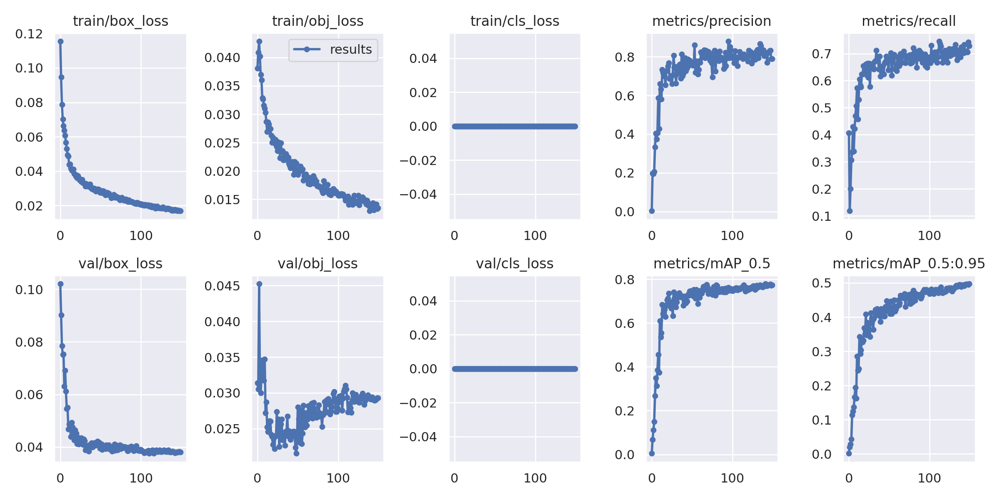

In [ ]:
from IPython.display import Image  # result.png파일을 보여주는 라이브러리 
Image(filename='/content/yolov5/runs/train/pothole_results3/results.png')

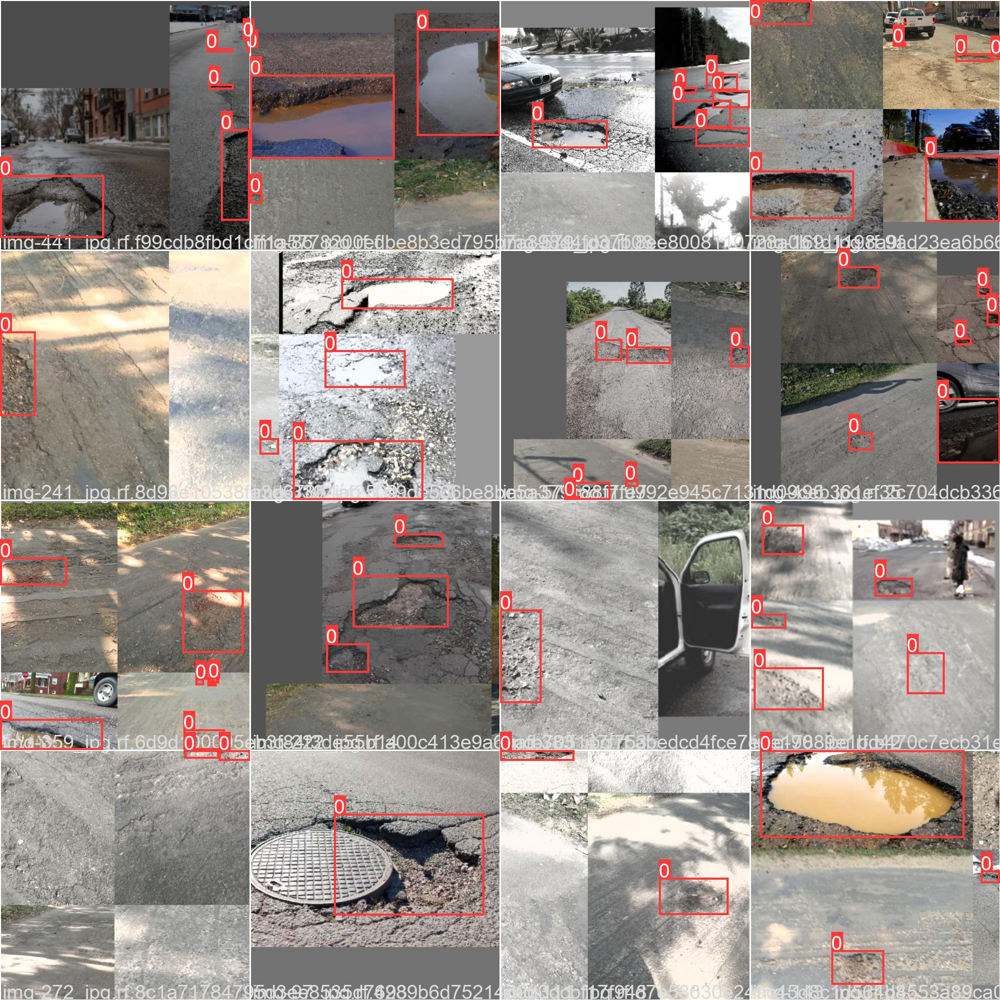

In [ ]:
Image(filename='/content/yolov5/runs/train/pothole_results3/train_batch0.jpg')

In [ ]:
!python val.py --weights runs/train/pothole_results3/weights/best.pt --data ./pothole/data.yaml --img 640 --iou 0.65 --half

val: data=./pothole/data.yaml, weights=['runs/train/pothole_results3/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v6.1-386-g2e57b84 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning '/content/yolov5/pothole/valid/labels.cache' images and labels... 133 found, 0 missing, 0 empty, 0 corrupt: 100% 133/133 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 5/5 [00:04<00:00,  1.04it/s]
                 all        133        330      0.782      0.733      0.768      0.494
Speed: 0.2ms pre-process, 7.3ms inference, 2.7ms NMS per image at shape (32, 3, 640, 640)
R

In [ ]:
# Test data에 적용한 성능지표
!python val.py --weights runs/train/pothole_results3/weights/best.pt --data ./pothole/data.yaml --img 640 --task test

val: data=./pothole/data.yaml, weights=['runs/train/pothole_results3/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-386-g2e57b84 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning '/content/yolov5/pothole/test/labels.cache' images and labels... 67 found, 0 missing, 0 empty, 0 corrupt: 100% 67/67 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 3/3 [00:02<00:00,  1.15it/s]
                 all         67        154      0.866      0.756      0.827      0.545
Speed: 0.5ms pre-process, 11.5ms inference, 2.2ms NMS per image at shape (32, 3, 640, 640)
Re

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/pothole_results3/weights/best.pt --img 640 --conf 0.4 --source ./pothole/test/images

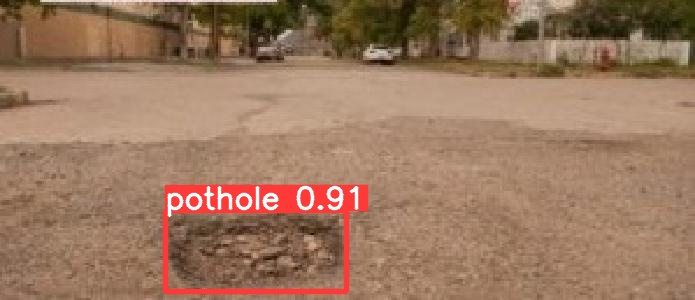

In [ ]:
import glob
import random
from IPython.display import Image, display

image_name = random.choice(glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'))
display(Image(filename=image_name))

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cp /content/yolo5/runs/train/pothole_results3/weights/best.pt /content/drive/MyDrive/Colab\Notebooks

cp: cannot stat '/content/yolo5/runs/train/pothole_results3/weights/best.pt': No such file or directory
